# Módulo de estatística 

## Projeto A - Análise do dataset "Wine Quality"

- Breno Marques
- Jayme Augusto
- José Santos

### Instruções

- O projeto deverá ser entregue até dia 22/11 antes do início da aula
- O projeto poderá ser feito em grupo com até 4 integrantes
- Serão 2 projetos A e B porém apenas 1 projeto deverá ser entregue e escolhido pelo grupo

- A entrega deve ser feita em jupyter notebook com os códigos explícitos e comentados. Além disso os conceitos, decisões e conclusões usadas devem estar destacadas no notebook
- A entrega pode ser feita pelo class ou no repositório do git de algum dos alunos
- Bom projeto

### Informações sobre o projeto

Dataset (conjunto de dados a ser utilizado) está disponível em:
    https://archive.ics.uci.edu/ml/datasets/Wine+Quality
    
Obs.: juntar os arquivos de vinho branco e tinto em um único dataframe

Data Set Information:

The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine. For more details, consult: [Web Link] or the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

These datasets can be viewed as classification or regression tasks. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.


Attribute Information:

Input variables (based on physicochemical tests): <br>
- 1 - fixed acidity
- 2 - volatile acidity
- 3 - citric acid
- 4 - residual sugar
- 5 - chlorides
- 6 - free sulfur dioxide
- 7 - total sulfur dioxide
- 8 - density
- 9 - pH
- 10 - sulphates
- 11 - alcohol

Output variable (based on sensory data): <br>
- 12 - quality (score between 0 and 10)

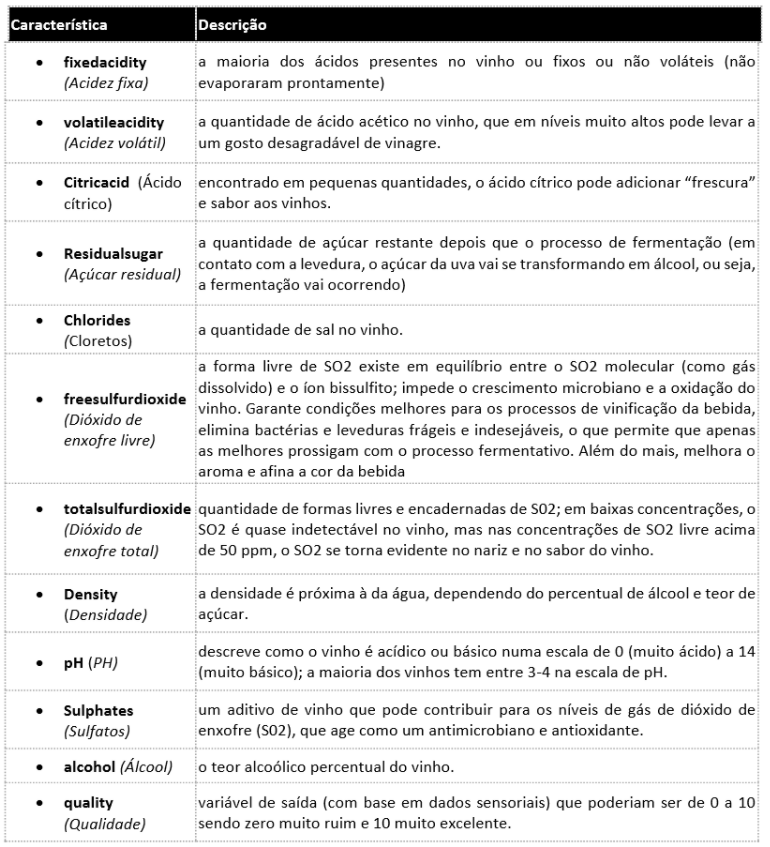

### Etapa 1

**EDA - Análise exploratória de dados**

- Análise das medidas de medidas de posição, dispersão, correlação (análises univaridas e bivariadas) - histograma, boxplot, mapa de calor, etc...
- Exclusão de outliers, caso necessário (sempre explicando a opção)



### Etapa 2

**Regressão Linear**

- Faça um algoritmo que estime a variável “Quality” em função das características físico-químicas dos vinhos
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

### Etapa 3

**Regressão logística**

- Sabendo que os vinhos com notas >= 6 são considerados vinhos de boa qualidade faça um algoritmo que classifique os vinhos em “Bom” ou “Ruim” em função de suas características físico-químicas;
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

# Resolução

**Tratamento dos dados**

In [1]:
# Imports utilizados em todos os exercícios
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy.stats import normaltest
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Import da biblioteca warnings para ignorar eventuais warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
red = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv', sep=';')
white = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv', sep=';')

In [3]:
# arquivo vinho tinto salvo
dfred = red.to_csv('projeto A - red', index=False)

In [4]:
# arquivo com 5 linhas para mostrar as features
dfred = pd.read_csv('projeto A - red')
dfred['wine'] = 'red'
dfred.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [5]:
# arquivo vinho branco salvo
dfwhite = white.to_csv('projeto A - white', index=False)

In [6]:
# arquivo com 5 linhas para mostrar as features
dfwhite = pd.read_csv('projeto A - white')
dfwhite['wine'] = 'white'
dfwhite.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,white
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,white
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,white
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white


In [7]:
# arquivos de vinho branco e tinto concatenados
df = pd.concat([dfred, dfwhite])
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white


In [8]:
# arquivo concatenado salvo
df.to_csv('projeto A', index=False)

In [9]:
# informações do arquivo concatenado
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6497 entries, 0 to 4897
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  wine                  6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 710.6+ KB


In [10]:
# contagem dos valores do arquivo concatenado
df.count()

fixed acidity           6497
volatile acidity        6497
citric acid             6497
residual sugar          6497
chlorides               6497
free sulfur dioxide     6497
total sulfur dioxide    6497
density                 6497
pH                      6497
sulphates               6497
alcohol                 6497
quality                 6497
wine                    6497
dtype: int64

### Etapa 1

**EDA - Análise exploratória de dados**

- Análise das medidas de medidas de posição, dispersão, correlação (análises univaridas e bivariadas) - histograma, boxplot, mapa de calor, etc...
- Exclusão de outliers, caso necessário (sempre explicando a opção)


In [11]:
# sumário dos valores de posição e de dispersão para todas as features do arquivo concatenado
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [12]:
df.columns.tolist()

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality',
 'wine']

**Análise univariada**

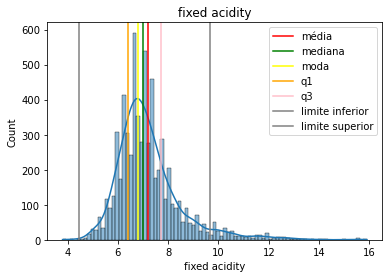

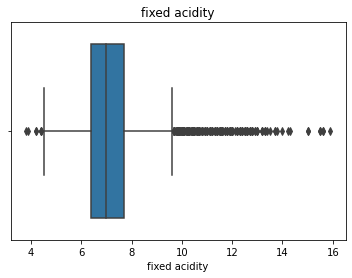

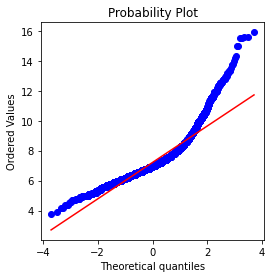

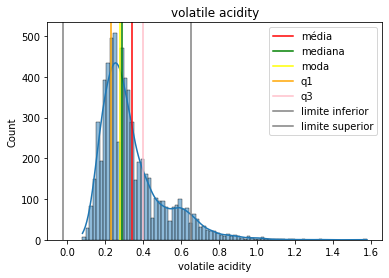

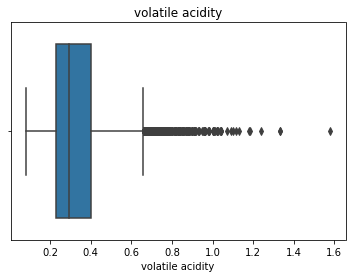

...

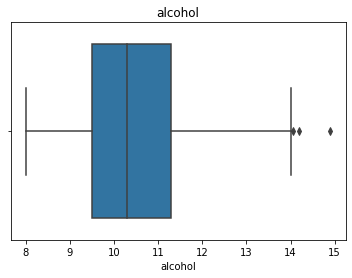

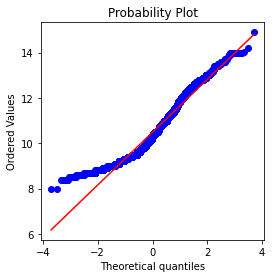

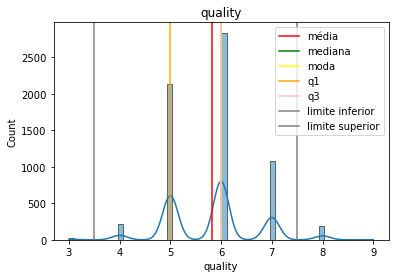

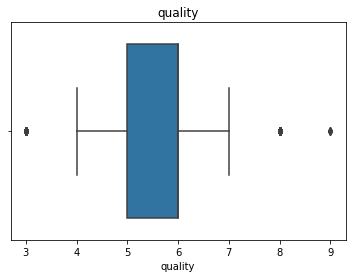

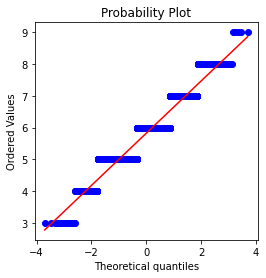

In [13]:
for item in ['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']:
    sns.histplot(df[item], kde=True)
    # plotando média
    plt.axvline(x=df[item].mean(), color="red", label="média")

    # plotando a mediana
    plt.axvline(df[item].median(), color="green", label="mediana")

    # Loop para plotar as modas
    for i in range(df[item].mode().shape[0]):
        plt.axvline(df[item].mode()[i], color="yellow", label="moda")

    plt.axvline(df[item].quantile(0.25), color="orange", label="q1")
    plt.axvline(df[item].quantile(0.75), color="pink", label="q3")

    IQR = df[item].quantile(0.75) - df[item].quantile(0.25)
    plt.axvline(df[item].quantile(0.25)-1.5 * IQR, color="grey", label="limite inferior")
    plt.axvline(df[item].quantile(0.75)+1.5 * IQR, color="grey", label="limite superior")

    plt.legend()

    plt.title(item)
    plt.show()
    plt.title(item)
    sns.boxplot(df[item])
    plt.show()
    
    from scipy import stats
    fig, ax = plt.subplots(figsize=(4, 4))

    stats.probplot(df[item], plot=ax)
    plt.show()
             

**Análise multivariada**

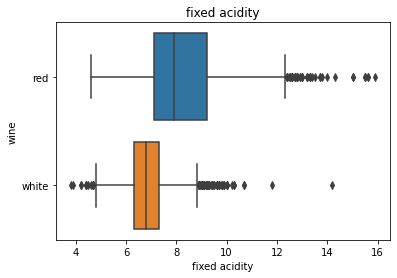

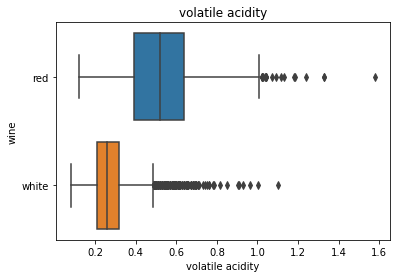

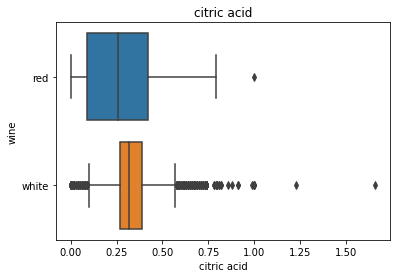

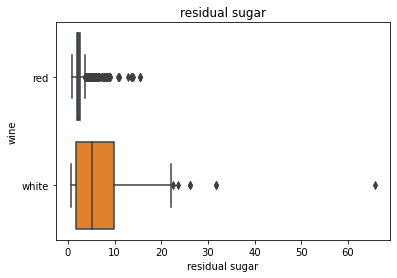

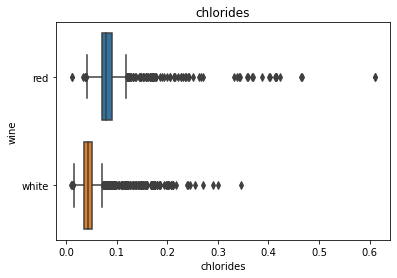

...

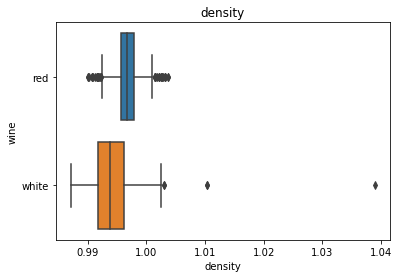

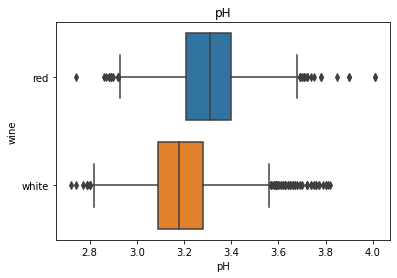

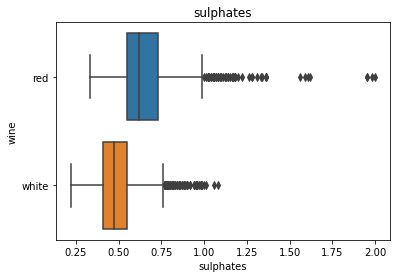

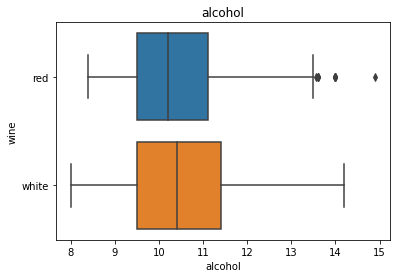

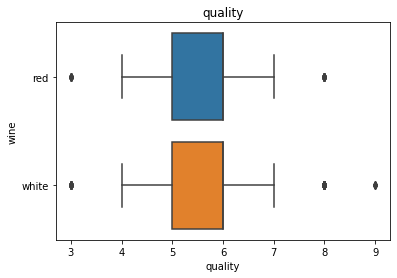

In [14]:
for item in ['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']:
    sns.boxplot(data=df, x=item, y='wine')
    plt.title(item)
    plt.show()

**Correlações**

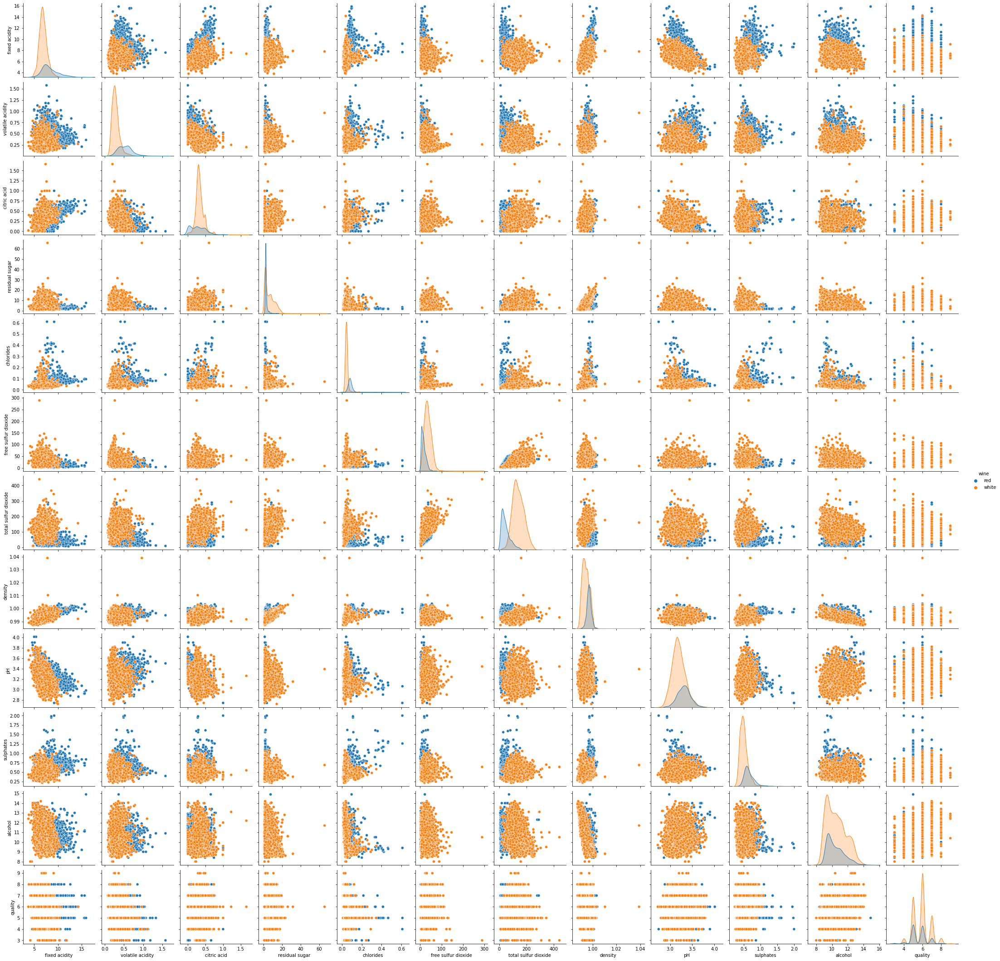

In [15]:
# Plot do pairplot
sns.pairplot(df, hue='wine')

# Mostra o gráfico
plt.show()

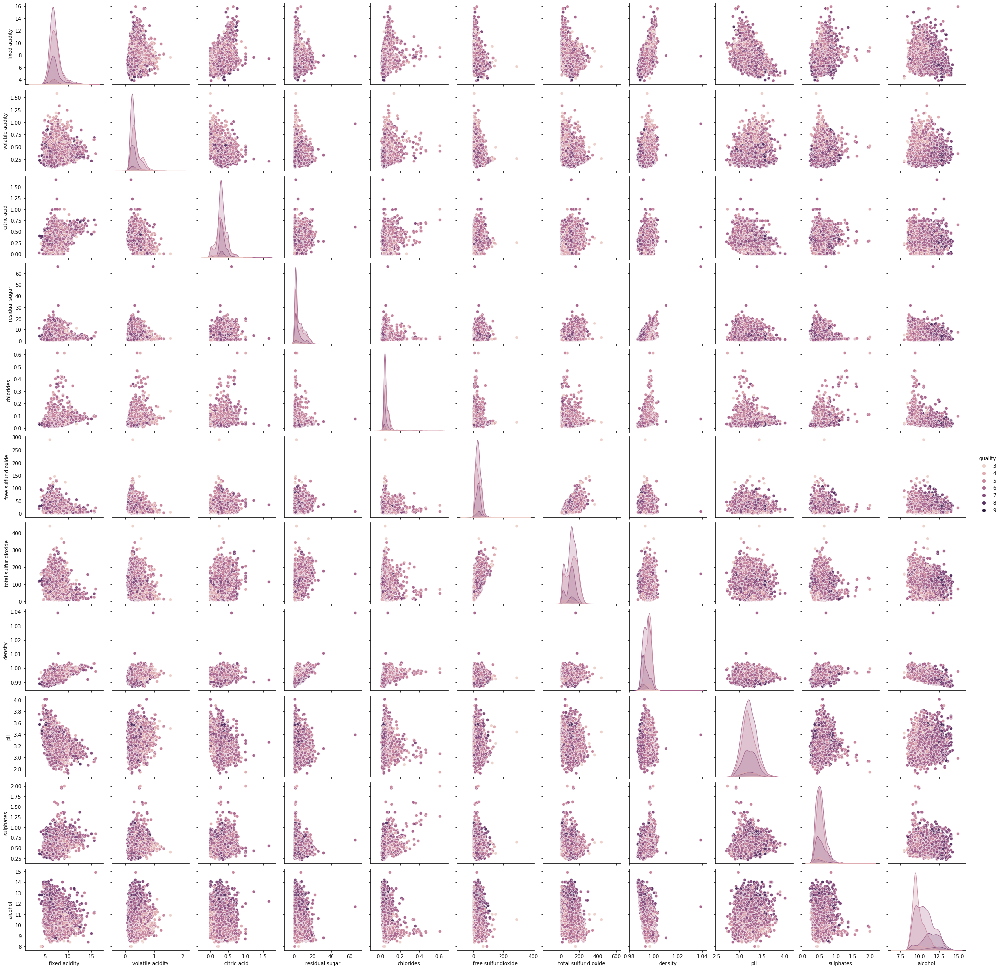

In [16]:
# Plot do pairplot
sns.pairplot(df, hue='quality')

# Mostra o gráfico
plt.show()

In [17]:
df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,0.219008,0.324436,-0.111981,0.298195,-0.282735,-0.329054,0.458910,-0.252700,0.299568,-0.095452,-0.076743
volatile acidity,0.219008,1.000000,-0.377981,-0.196011,0.377124,-0.352557,-0.414476,0.271296,0.261454,0.225984,-0.037640,-0.265699
citric acid,0.324436,-0.377981,1.000000,0.142451,0.038998,0.133126,0.195242,0.096154,-0.329808,0.056197,-0.010493,0.085532
residual sugar,-0.111981,-0.196011,0.142451,1.000000,-0.128940,0.402871,0.495482,0.552517,-0.267320,-0.185927,-0.359415,-0.036980
chlorides,0.298195,0.377124,0.038998,-0.128940,1.000000,-0.195045,-0.279630,0.362615,0.044708,0.395593,-0.256916,-0.200666
free sulfur dioxide,-0.282735,-0.352557,0.133126,0.402871,-0.195045,1.000000,0.720934,0.025717,-0.145854,-0.188457,-0.179838,0.055463
total sulfur dioxide,-0.329054,-0.414476,0.195242,0.495482,-0.279630,0.720934,1.000000,0.032395,-0.238413,-0.275727,-0.265740,-0.041385
density,0.458910,0.271296,0.096154,0.552517,0.362615,0.025717,0.032395,1.000000,0.011686,0.259478,-0.686745,-0.305858
pH,-0.252700,0.261454,-0.329808,-0.267320,0.044708,-0.145854,-0.238413,0.011686,1.000000,0.192123,0.121248,0.019506
sulphates,0.299568,0.225984,0.056197,-0.185927,0.395593,-0.188457,-0.275727,0.259478,0.192123,1.000000,-0.003029,0.038485


<AxesSubplot:>

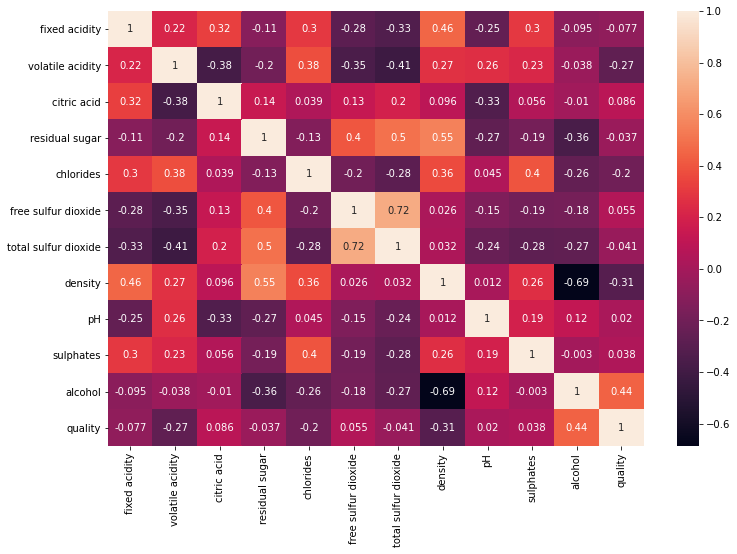

In [18]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='rocket')

### Etapa 2

**Regressão Linear**

- Faça um algoritmo que estime a variável “Quality” em função das características físico-químicas dos vinhos
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

**2.1 Modelo**

In [19]:
# Separação dos dados entre variáveis e resposta
X = df.drop(['quality', 'wine'], axis = 1)
y = df['quality']

In [20]:
# Separação em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state = 42)

In [21]:
# Define como será feito a normalização
scaler = StandardScaler()

In [22]:
# Normalizando os dados de treino e teste
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [23]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [24]:
# Define o modelo de Regressão linear
linreg = LinearRegression()

In [25]:
# Fit do modelo
linreg.fit(X_train_std, y_train)

LinearRegression()

In [26]:
# Fazendo as predições
y_pred = linreg.predict(X_test_std)

In [27]:
# Visualizando as predições
y_pred

array([6.65205969, 5.00475598, 6.29378238, ..., 6.42669841, 6.45276417,
       5.59884935])

**2.2 Avaliando o modelo**

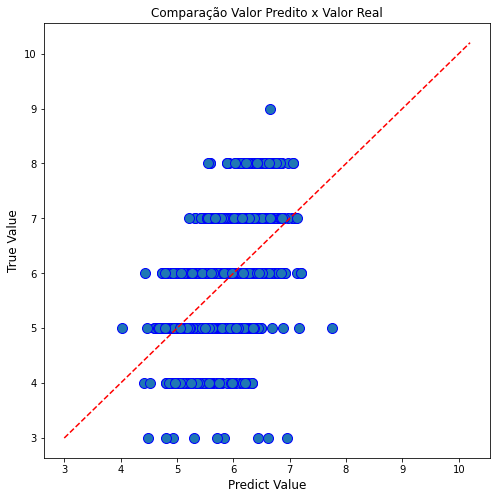

In [28]:
# Configurações do Gráfico comparativo
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# Mostra a reta diagonal, que representa a predição perfeita
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl

# Plot do gráfico comparando ambos o teste e as predições
plt.plot(xl, yl, 'r--')

# Mostra o gráfico
plt.show()

In [29]:
# Print das Métricas
print('Métricas para a Previsão:')
print('Erro Absoluto Médio:   ', np.round(mean_absolute_error(y_test, y_pred), 3))
print('Erro Quadrãtico Médio: ', np.round(mean_squared_error(y_test, y_pred), 3))
print('R^2:                   ', np.round(r2_score(y_test, y_pred), 3))

Métricas para a Previsão:
Erro Absoluto Médio:    0.564
Erro Quadrãtico Médio:  0.533
R^2:                    0.27


In [30]:
# Determiando o Feature Importance
coefs = linreg.coef_

# Cria as listas
list_columns = X_train.columns
list_feature = []
list_score = []

# atrela cada feature a um score
for i, v in enumerate(coefs):
    list_feature.append(list_columns[i])
    list_score.append(v)

# Monta um dicionário
dictionary = {'Features': list_feature,
              'Scores': list_score}

# converte o dicionário em dataframe
df_features = pd.DataFrame(dictionary)
df_features = df_features.sort_values(by=['Scores'], ascending=False)
df_features.reset_index(inplace=True, drop=True)

# Plot das 10 principais features
df_features.head(12)

,Features,Scores
0,alcohol,0.325484
1,residual sugar,0.233672
2,free sulfur dioxide,0.121106
3,sulphates,0.118759
4,fixed acidity,0.103112
5,pH,0.073468
6,chlorides,-0.001928
7,citric acid,-0.022019
8,total sulfur dioxide,-0.148938
9,density,-0.185577


<AxesSubplot:xlabel='Scores', ylabel='Features'>

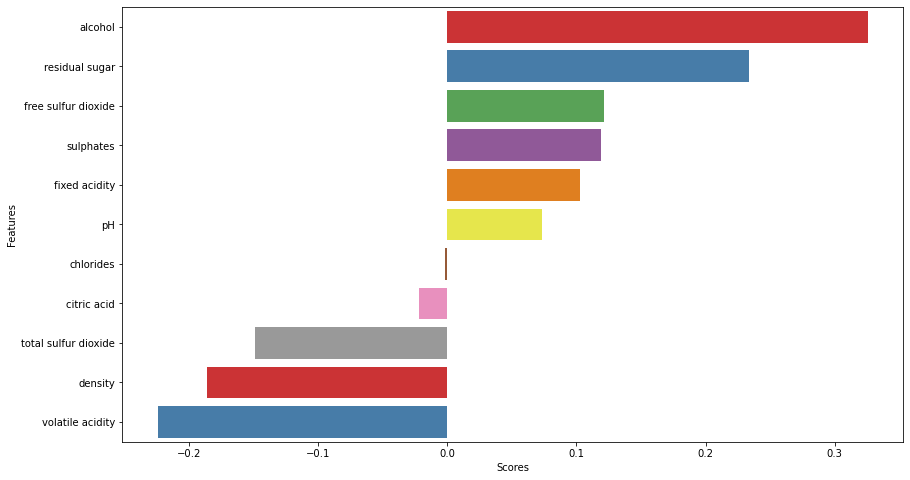

In [31]:
plt.figure(figsize=(14,8))
sns.barplot(x='Scores', y='Features', data=df_features, palette='Set1')

### Etapa 3

**Regressão logística**

- Sabendo que os vinhos com notas >= 6 são considerados vinhos de boa qualidade faça um algoritmo que classifique os vinhos em “Bom” ou “Ruim” em função de suas características físico-químicas;
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

In [32]:
#ajustando casas decimais dos valores do dataset
pd.set_option('display.float_format', lambda x: '%.3f' % x)
#ajuste de precisão dos dados
np.set_printoptions(suppress=True, precision=3) 

In [33]:
# avaliando a distribuição do target

df["quality"].value_counts(normalize=True)

6   0.437
5   0.329
7   0.166
4   0.033
8   0.030
3   0.005
9   0.001
Name: quality, dtype: float64

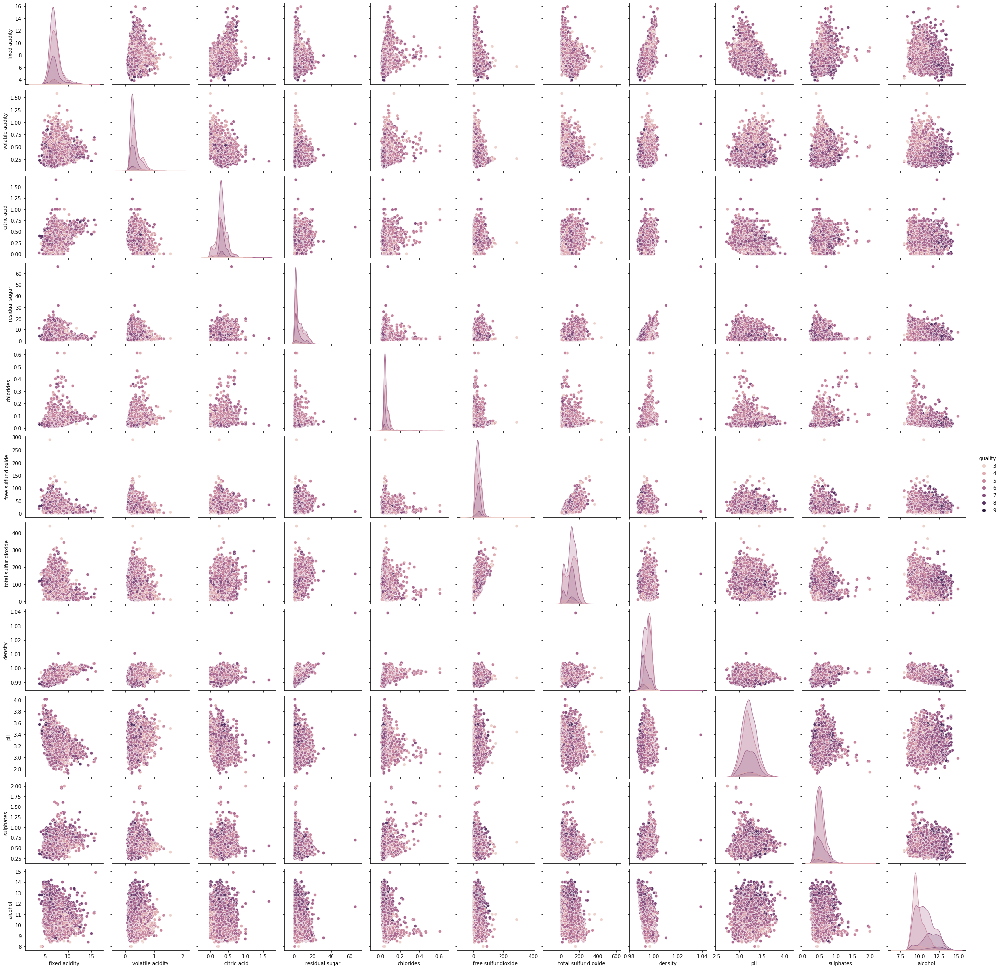

In [34]:
# pairplot usando o hue como target
sns.pairplot(df, hue="quality")

In [35]:
# criando as variáveis X e y, com as features e o target

X = df.select_dtypes(include=[np.number]).drop(columns="quality")
y = df["quality"]

In [36]:
#Separando os dados em dados de treino e dados de teste

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.3, 
                                                    random_state=42)

In [37]:
#  Importando a classe do estimador que se deseja treinar

from sklearn.linear_model import LogisticRegression

# Instanciando a classe do estimador, escolhendo os hiperparâmetros desejados

model = LogisticRegression()

# ajustar o modelo -> treinar o modelo

model.fit(X_train, y_train)

LogisticRegression()

In [38]:
# testar o modelo -> predizer os valores de Xtest

y_pred = model.predict(X_test)

In [39]:
y_pred

array([6, 5, 6, ..., 6, 6, 6], dtype=int64)

In [40]:
y_test

1504    8
1419    5
3162    7
3091    6
2433    6
       ..
2695    6
2158    6
4355    6
2819    6
4583    6
Name: quality, Length: 1950, dtype: int64

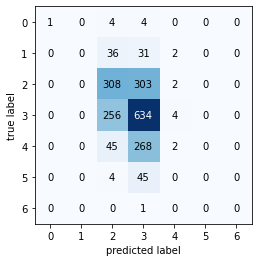

In [41]:
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(conf_mat=cm)
plt.show()

In [42]:
print('Acurácia: ', accuracy_score(y_test, y_pred))


Acurácia:  0.4846153846153846


In [43]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           3       1.00      0.11      0.20         9
           4       0.00      0.00      0.00        69
           5       0.47      0.50      0.49       613
           6       0.49      0.71      0.58       894
           7       0.20      0.01      0.01       315
           8       0.00      0.00      0.00        49
           9       0.00      0.00      0.00         1

    accuracy                           0.48      1950
   macro avg       0.31      0.19      0.18      1950
weighted avg       0.41      0.48      0.42      1950



**Reanálise após remoção dos outliers**

In [44]:
# calculando os outliers

for item in ['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol']:
    print("\nOutliers", item)
    print("\nq1:",np.quantile(df[item], 0.25))
    print("q3:",np.quantile(df[item], 0.75))
    print("\nmédia:",np.mean(df[item]))
    print("mediana:",np.median(df[item]))

# Calculando o intervalo interquartil
    iqr = np.quantile(df[item], 0.75) - np.quantile(df[item], 0.25)

# Print do IQR
    print("\nIQR:", iqr)

    q1 = np.quantile(df[item], 0.25)
    q3 = np.quantile(df[item], 0.75)

    sup = q3+iqr
    inf = q1-iqr

    print("\nOutliers limite superior:", sup)
    print("Outliers limite inferior:", inf)


Outliers fixed acidity

q1: 6.4
q3: 7.7

média: 7.215307064799134
mediana: 7.0

IQR: 1.2999999999999998

Outliers limite superior: 9.0
Outliers limite inferior: 5.1000000000000005

Outliers volatile acidity

q1: 0.23
q3: 0.4

média: 0.33966599969217015
mediana: 0.29

IQR: 0.17

Outliers limite superior: 0.5700000000000001
Outliers limite inferior: 0.06

Outliers citric acid

q1: 0.25
q3: 0.39

média: 0.3186332153301454
mediana: 0.31

IQR: 0.14

Outliers limite superior: 0.53
Outliers limite inferior: 0.10999999999999999

Outliers residual sugar

q1: 1.8
q3: 8.1

média: 5.4432353393874156
mediana: 3.0

IQR: 6.3

Outliers limite superior: 14.399999999999999
Outliers limite inferior: -4.5

Outliers chlorides

q1: 0.038
q3: 0.065

média: 0.0560338617823606
mediana: 0.047

IQR: 0.027000000000000003

Outliers limite superior: 0.092
Outliers limite inferior: 0.010999999999999996

Outliers free sulfur dioxide

q1: 17.0
q3: 41.0

média: 30.525319378174544
mediana: 29.0

IQR: 24.0

Outliers lim

In [45]:
#removendo os outliers

for item in ['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol']:
    df1 = df[(df[item] > inf) & (df[item] < sup)]

In [46]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine
0,7.400,0.700,0.000,1.900,0.076,11.000,34.000,0.998,3.510,0.560,9.400,5,red
1,7.800,0.880,0.000,2.600,0.098,25.000,67.000,0.997,3.200,0.680,9.800,5,red
2,7.800,0.760,0.040,2.300,0.092,15.000,54.000,0.997,3.260,0.650,9.800,5,red
3,11.200,0.280,0.560,1.900,0.075,17.000,60.000,0.998,3.160,0.580,9.800,6,red
4,7.400,0.700,0.000,1.900,0.076,11.000,34.000,0.998,3.510,0.560,9.400,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.200,0.210,0.290,1.600,0.039,24.000,92.000,0.991,3.270,0.500,11.200,6,white
4894,6.600,0.320,0.360,8.000,0.047,57.000,168.000,0.995,3.150,0.460,9.600,5,white
4895,6.500,0.240,0.190,1.200,0.041,30.000,111.000,0.993,2.990,0.460,9.400,6,white
4896,5.500,0.290,0.300,1.100,0.022,20.000,110.000,0.989,3.340,0.380,12.800,7,white


**EDA**

In [47]:
df1.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6393.000,6393.000,6393.000,6393.000,6393.000,6393.000,6393.000,6393.000,6393.000,6393.000,6393.000,6393.000
mean,7.227,0.339,0.319,5.477,0.056,30.611,116.119,0.995,3.218,0.531,10.442,5.804
std,1.288,0.165,0.145,4.782,0.035,17.813,56.729,0.003,0.160,0.148,1.136,0.867
min,3.800,0.080,0.000,0.600,0.012,1.000,6.000,0.988,2.720,0.230,8.000,3.000
25%,6.400,0.230,0.250,1.800,0.038,17.000,77.000,0.992,3.110,0.430,9.500,5.000
50%,7.000,0.290,0.310,3.000,0.047,29.000,119.000,0.995,3.210,0.510,10.300,6.000
75%,7.700,0.400,0.390,8.200,0.066,41.500,156.000,0.997,3.320,0.600,11.300,6.000
max,15.600,1.580,1.660,65.800,0.611,289.000,440.000,1.039,4.010,2.000,13.100,9.000


**Análise univariada**

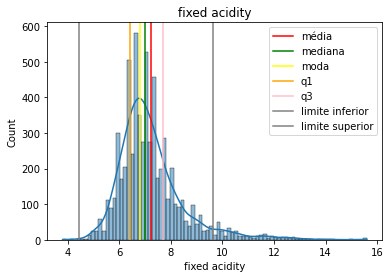

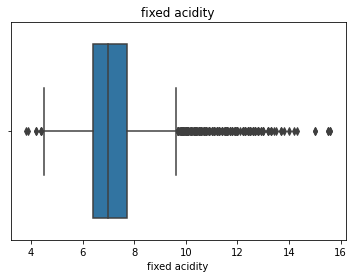

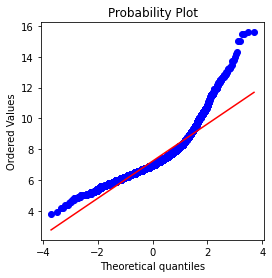

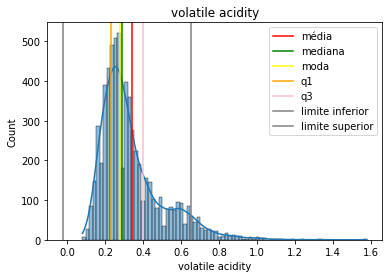

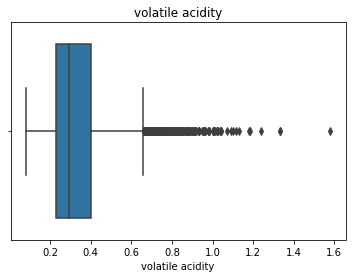

...

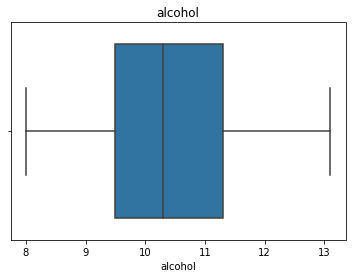

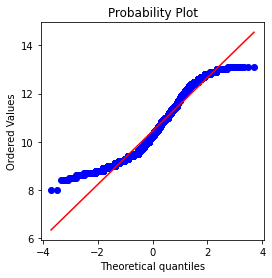

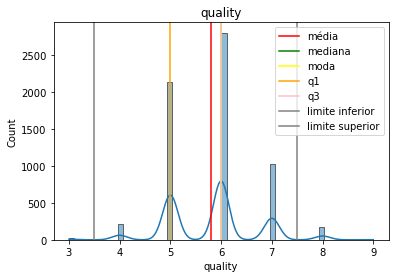

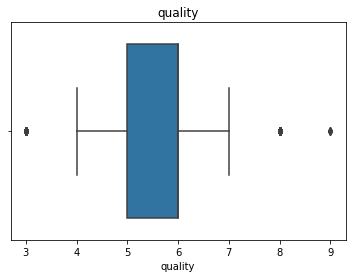

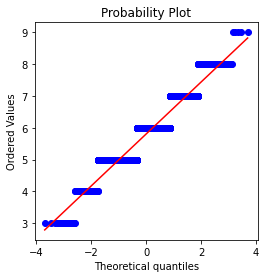

In [48]:
for item in ['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']:
    sns.histplot(df1[item], kde=True)
    # plotando média
    plt.axvline(x=df1[item].mean(), color="red", label="média")

    # plotando a mediana
    plt.axvline(df1[item].median(), color="green", label="mediana")

    # Loop para plotar as modas
    for i in range(df1[item].mode().shape[0]):
        plt.axvline(df1[item].mode()[i], color="yellow", label="moda")

    plt.axvline(df1[item].quantile(0.25), color="orange", label="q1")
    plt.axvline(df1[item].quantile(0.75), color="pink", label="q3")

    IQR = df1[item].quantile(0.75) - df[item].quantile(0.25)
    plt.axvline(df1[item].quantile(0.25)-1.5 * IQR, color="grey", label="limite inferior")
    plt.axvline(df1[item].quantile(0.75)+1.5 * IQR, color="grey", label="limite superior")

    plt.legend()

    plt.title(item)
    plt.show()
    plt.title(item)
    sns.boxplot(df1[item])
    plt.show()
    
    from scipy import stats
    fig, ax = plt.subplots(figsize=(4, 4))

    stats.probplot(df1[item], plot=ax)
    plt.show()

**Análise multivariada**

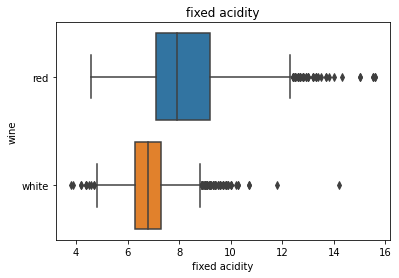

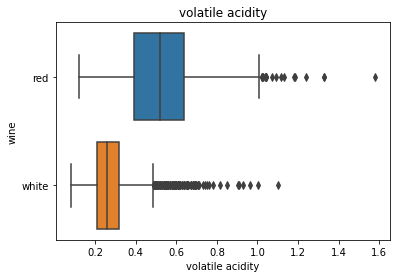

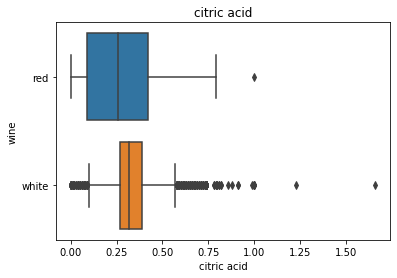

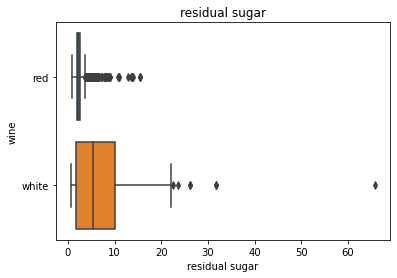

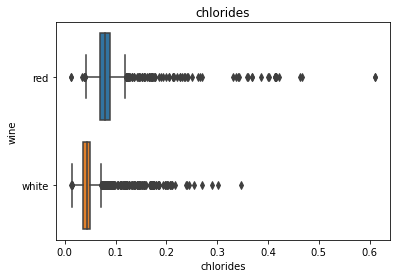

...

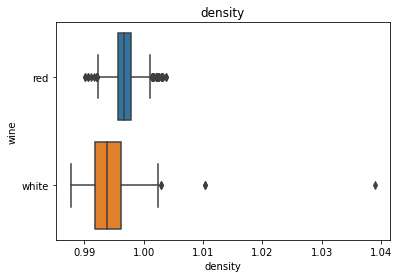

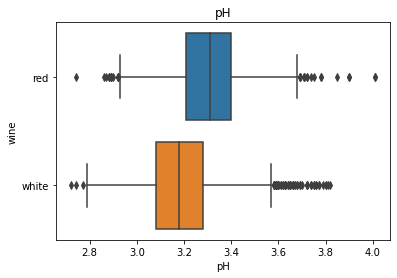

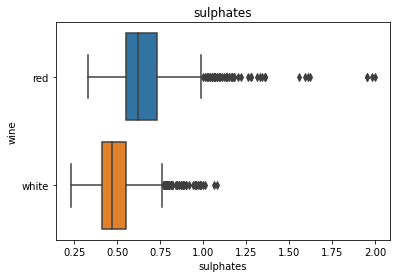

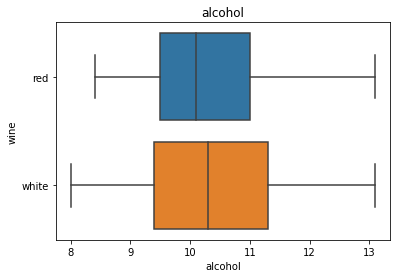

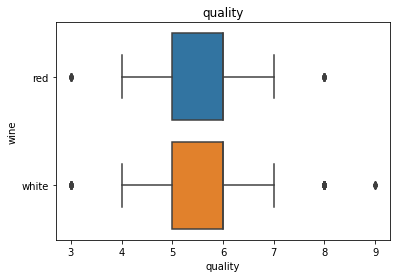

In [49]:
for item in ['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']:
    sns.boxplot(data=df1, x=item, y='wine')
    plt.title(item)
    plt.show()

**Correlações**

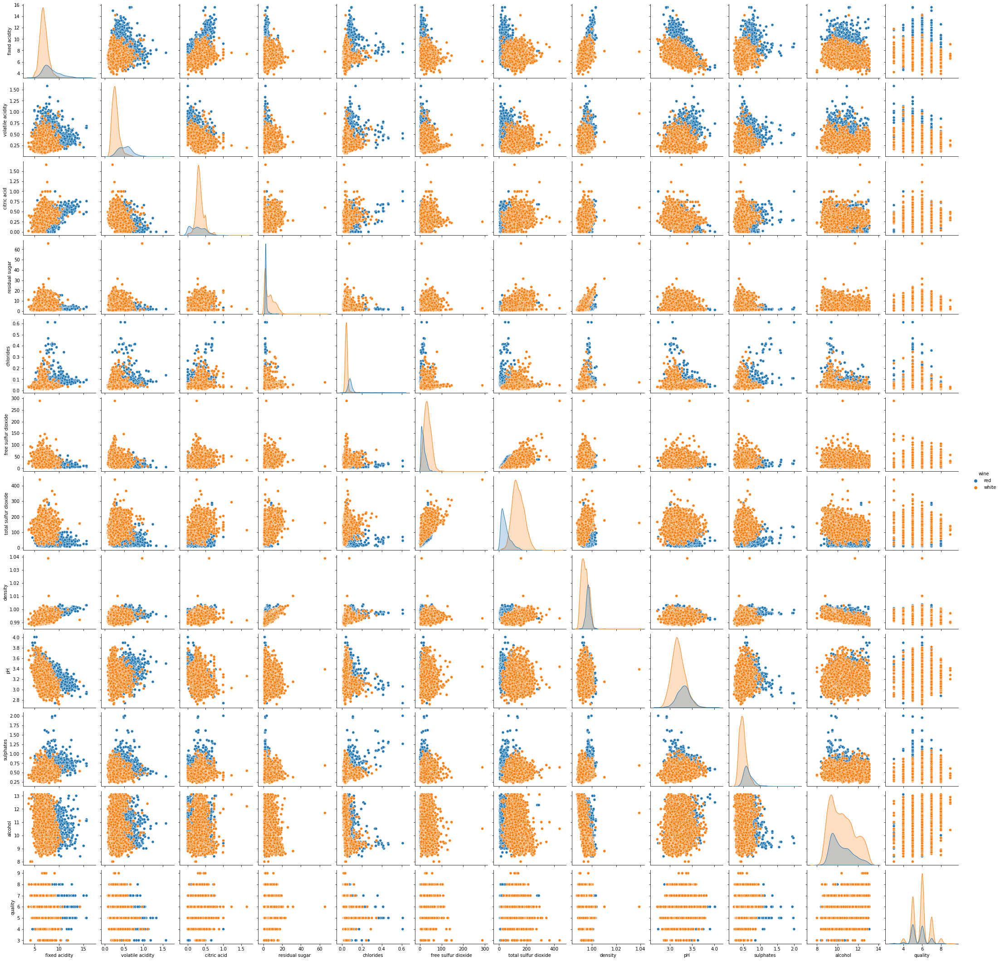

In [50]:
# Plot do pairplot
sns.pairplot(df1, hue='wine')

# Mostra o gráfico
plt.show()

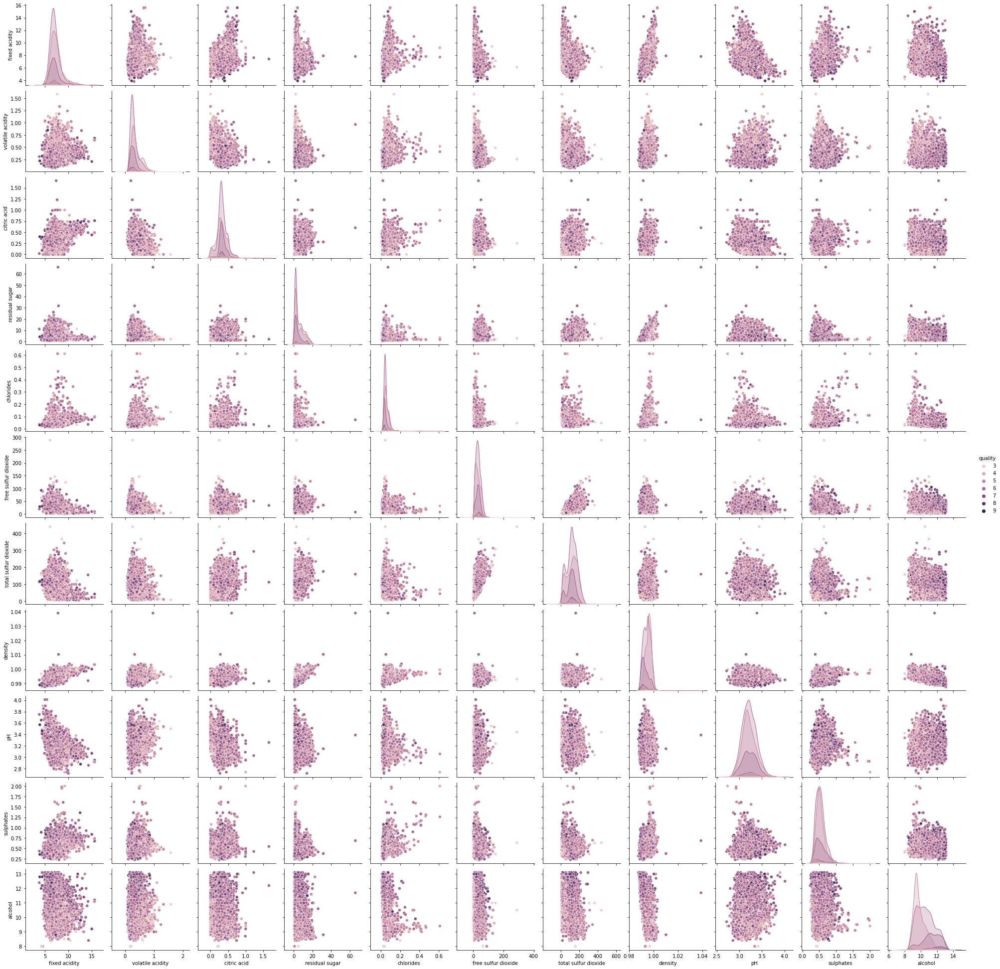

In [51]:
# Plot do pairplot
sns.pairplot(df1, hue='quality')

# Mostra o gráfico
plt.show()

In [52]:
df1.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000,0.226,0.315,-0.121,0.293,-0.289,-0.336,0.451,-0.247,0.308,-0.077,-0.067
volatile acidity,0.226,1.000,-0.379,-0.195,0.383,-0.353,-0.415,0.286,0.263,0.223,-0.055,-0.276
citric acid,0.315,-0.379,1.000,0.140,0.033,0.134,0.198,0.087,-0.327,0.063,0.002,0.094
residual sugar,-0.121,-0.195,0.140,1.000,-0.133,0.404,0.496,0.555,-0.267,-0.187,-0.362,-0.031
chlorides,0.293,0.383,0.033,-0.133,1.000,-0.197,-0.283,0.357,0.046,0.401,-0.254,-0.196
free sulfur dioxide,-0.289,-0.353,0.134,0.404,-0.197,1.000,0.721,0.023,-0.144,-0.186,-0.178,0.060
total sulfur dioxide,-0.336,-0.415,0.198,0.496,-0.283,0.721,1.000,0.027,-0.239,-0.278,-0.264,-0.038
density,0.451,0.286,0.087,0.555,0.357,0.023,0.027,1.000,0.016,0.267,-0.677,-0.291
pH,-0.247,0.263,-0.327,-0.267,0.046,-0.144,-0.239,0.016,1.000,0.185,0.119,0.016
sulphates,0.308,0.223,0.063,-0.187,0.401,-0.186,-0.278,0.267,0.185,1.000,-0.013,0.035


<AxesSubplot:>

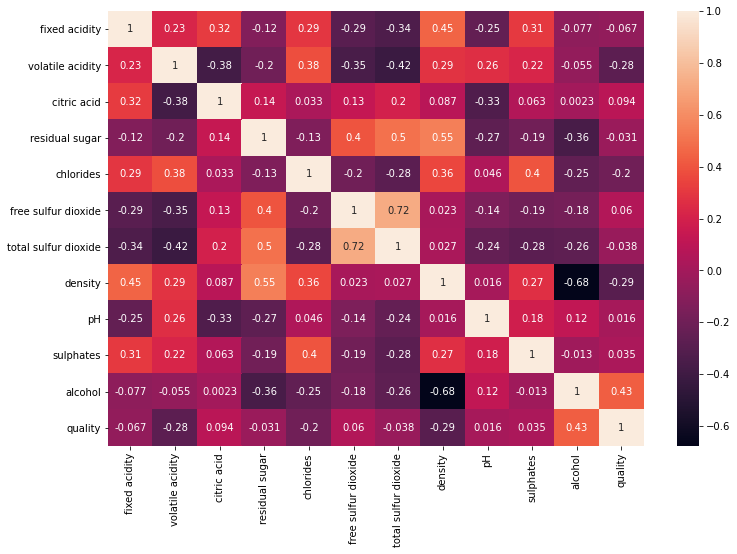

In [53]:
plt.figure(figsize=(12, 8))
sns.heatmap(df1.corr(), annot=True, cmap='rocket')

**Regressão Linear**

**Modelo**

In [54]:
# Separação dos dados entre variáveis e resposta
X = df1.drop(['quality', 'wine'], axis = 1)
y = df1['quality']

In [55]:
# Separação em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state = 42)

In [56]:
# Definindo como será feito a normalização
scaler = StandardScaler()

In [57]:
# Normalizando os dados de treino e teste
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [58]:
# Definindo o modelo de Regressão linear
linreg = LinearRegression()

In [59]:
# Fit do modelo
linreg.fit(X_train_std, y_train)

LinearRegression()

In [60]:
# Fazendo as predições
y_pred = linreg.predict(X_test_std)

In [61]:
# Visualizando as predições
y_pred

array([5.351, 6.178, 5.356, ..., 6.572, 5.613, 6.609])

**Avaliando o modelo**

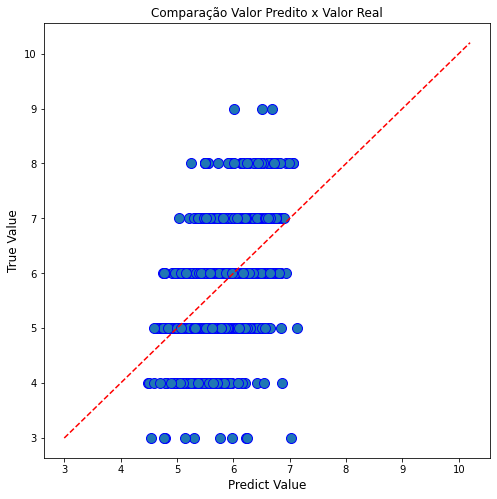

In [62]:
#Gráfico comparativo
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# Mostra a reta diagonal, que representa a predição perfeita
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl

# Plot do gráfico comparando ambos o teste e as predições
plt.plot(xl, yl, 'r--')

# Mostra o gráfico
plt.show()

In [63]:
# Print das Métricas
print('Métricas para a Previsão:')
print('Erro Absoluto Médio:   ', np.round(mean_absolute_error(y_test, y_pred), 3))
print('Erro Quadrãtico Médio: ', np.round(mean_squared_error(y_test, y_pred), 3))
print('R^2:                   ', np.round(r2_score(y_test, y_pred), 3))

Métricas para a Previsão:
Erro Absoluto Médio:    0.579
Erro Quadrãtico Médio:  0.565
R^2:                    0.268


In [64]:
# Determiando o Feature Importance
coefs = linreg.coef_

# Cria as listas
list_columns = X_train.columns
list_feature = []
list_score = []

# atrela cada feature a um score
for i, v in enumerate(coefs):
    list_feature.append(list_columns[i])
    list_score.append(v)

# Monta um dicionário
dictionary = {'Features': list_feature,
              'Scores': list_score}

# converte o dicionário em dataframe
df_features = pd.DataFrame(dictionary)
df_features = df_features.sort_values(by=['Scores'], ascending=False)
df_features.reset_index(inplace=True, drop=True)

# Plot das principais features
df_features.head(12)

,Features,Scores
0,alcohol,0.316
1,residual sugar,0.205
2,free sulfur dioxide,0.124
3,sulphates,0.106
4,fixed acidity,0.086
5,pH,0.084
6,citric acid,-0.006
7,chlorides,-0.008
8,total sulfur dioxide,-0.143
9,density,-0.155


<AxesSubplot:xlabel='Scores', ylabel='Features'>

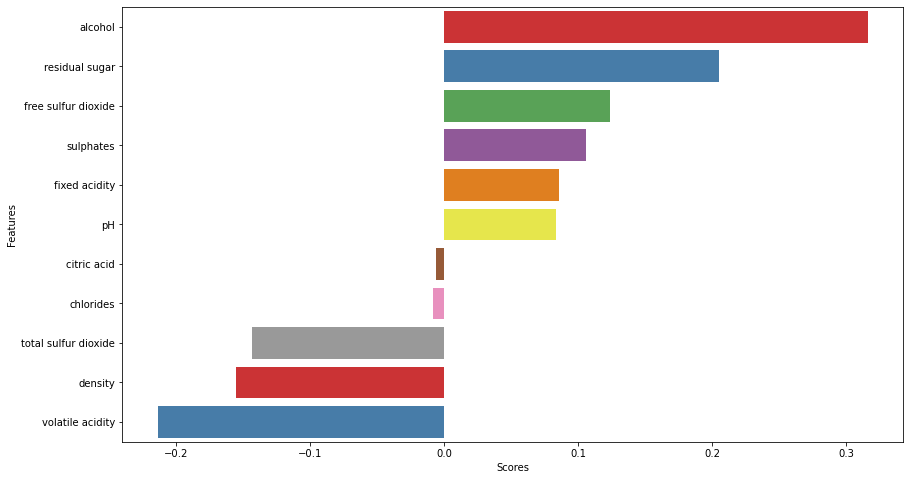

In [65]:
plt.figure(figsize=(14,8))
sns.barplot(x='Scores', y='Features', data=df_features, palette='Set1')

**Regressão logística**

In [66]:
#ajuste de precisão dos dados

pd.set_option('display.float_format', lambda x: '%.3f' % x)

np.set_printoptions(suppress=True, precision=3)

In [67]:
# avaliando a distribuição do target

df1["quality"].value_counts(normalize=True)

6   0.438
5   0.334
7   0.160
4   0.034
8   0.028
3   0.005
9   0.001
Name: quality, dtype: float64

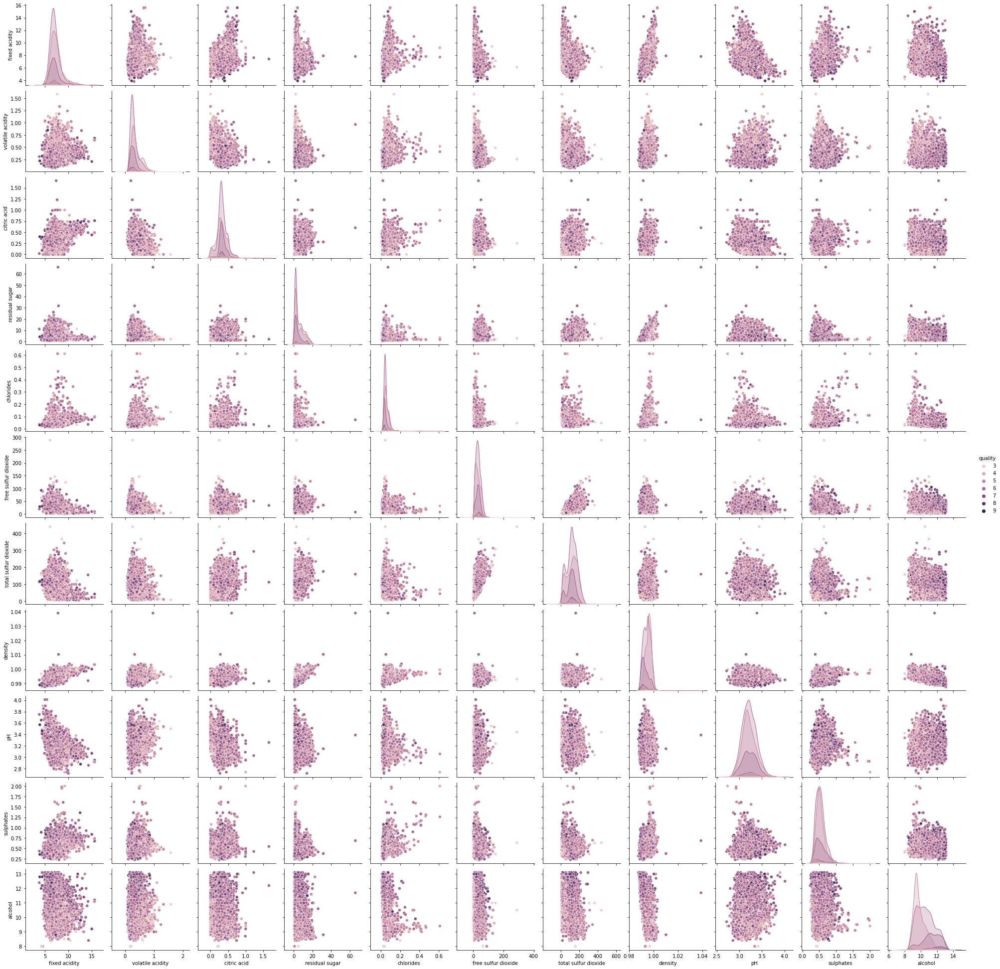

In [68]:
# pairplot usando o hue como target
sns.pairplot(df1, hue="quality")

In [69]:
# criando as variáveis X e y, com as features e o target

X = df1.select_dtypes(include=[np.number]).drop(columns="quality")
y = df1["quality"]

In [70]:
#Separando os dados em dados de treino e dados de teste

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.3, 
                                                    random_state=42)

In [71]:
#  Importando a classe do estimador que se deseja treinar

from sklearn.linear_model import LogisticRegression

# Instanciando a classe do estimador, escolhendo os hiperparâmetros desejados

model = LogisticRegression()

# ajustar o modelo -> treinar o modelo

model.fit(X_train, y_train)

LogisticRegression()

In [72]:
# teste do modelo -> predição dos valores de Xtest

y_pred = model.predict(X_test)

In [73]:
y_pred

array([6, 6, 6, ..., 6, 5, 6], dtype=int64)

In [74]:
y_test

839     5
3818    6
254     6
327     6
132     5
       ..
314     5
1104    5
4072    7
1241    5
1650    7
Name: quality, Length: 1918, dtype: int64

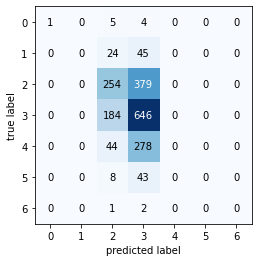

In [75]:
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(conf_mat=cm)
plt.show()

In [76]:
print('Acurácia: ', accuracy_score(y_test, y_pred))

Acurácia:  0.4697601668404588


In [77]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           3       1.00      0.10      0.18        10
           4       0.00      0.00      0.00        69
           5       0.49      0.40      0.44       633
           6       0.46      0.78      0.58       830
           7       0.00      0.00      0.00       322
           8       0.00      0.00      0.00        51
           9       0.00      0.00      0.00         3

    accuracy                           0.47      1918
   macro avg       0.28      0.18      0.17      1918
weighted avg       0.37      0.47      0.40      1918



Os dados se mostraram pouco alterados com a retirada dos outliers. Os gráficos ficaram semelhantes - exceto os relacionados ao "total sulphur dioxide", aparentemente mais correlacionados com os dados de "free sulphur dioxide" - , o R2 ficou pouco alterado, a acurácia ficou um pouco menor. Concluímos que a retirada dos outliers não beneficiou a análise.

**Reanálise com classificação da qualidade dos vinhos a partir de suas notas**

In [78]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine
0,7.400,0.700,0.000,1.900,0.076,11.000,34.000,0.998,3.510,0.560,9.400,5,red
1,7.800,0.880,0.000,2.600,0.098,25.000,67.000,0.997,3.200,0.680,9.800,5,red
2,7.800,0.760,0.040,2.300,0.092,15.000,54.000,0.997,3.260,0.650,9.800,5,red
3,11.200,0.280,0.560,1.900,0.075,17.000,60.000,0.998,3.160,0.580,9.800,6,red
4,7.400,0.700,0.000,1.900,0.076,11.000,34.000,0.998,3.510,0.560,9.400,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.200,0.210,0.290,1.600,0.039,24.000,92.000,0.991,3.270,0.500,11.200,6,white
4894,6.600,0.320,0.360,8.000,0.047,57.000,168.000,0.995,3.150,0.460,9.600,5,white
4895,6.500,0.240,0.190,1.200,0.041,30.000,111.000,0.993,2.990,0.460,9.400,6,white
4896,5.500,0.290,0.300,1.100,0.022,20.000,110.000,0.989,3.340,0.380,12.800,7,white


In [79]:
#codificação do novo target, a partir das notas de quality

df.loc[df['quality'] <= 5, 'conceito'] = 0
df.loc[df['quality'] >= 6, 'conceito'] = 1
0
print ('Conceito:')
print ('0: vinho mediano')
print ('1: vinho bom')

Conceito:
0: vinho mediano
1: vinho bom


In [80]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine,conceito
0,7.400,0.700,0.000,1.900,0.076,11.000,34.000,0.998,3.510,0.560,9.400,5,red,0.000
1,7.800,0.880,0.000,2.600,0.098,25.000,67.000,0.997,3.200,0.680,9.800,5,red,0.000
2,7.800,0.760,0.040,2.300,0.092,15.000,54.000,0.997,3.260,0.650,9.800,5,red,0.000
3,11.200,0.280,0.560,1.900,0.075,17.000,60.000,0.998,3.160,0.580,9.800,6,red,1.000
4,7.400,0.700,0.000,1.900,0.076,11.000,34.000,0.998,3.510,0.560,9.400,5,red,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.200,0.210,0.290,1.600,0.039,24.000,92.000,0.991,3.270,0.500,11.200,6,white,1.000
4894,6.600,0.320,0.360,8.000,0.047,57.000,168.000,0.995,3.150,0.460,9.600,5,white,0.000
4895,6.500,0.240,0.190,1.200,0.041,30.000,111.000,0.993,2.990,0.460,9.400,6,white,1.000
4896,5.500,0.290,0.300,1.100,0.022,20.000,110.000,0.989,3.340,0.380,12.800,7,white,1.000


In [81]:
df['conceito'].value_counts(dropna = False)

1.000    4113
0.000    2384
Name: conceito, dtype: int64

**Correlações**

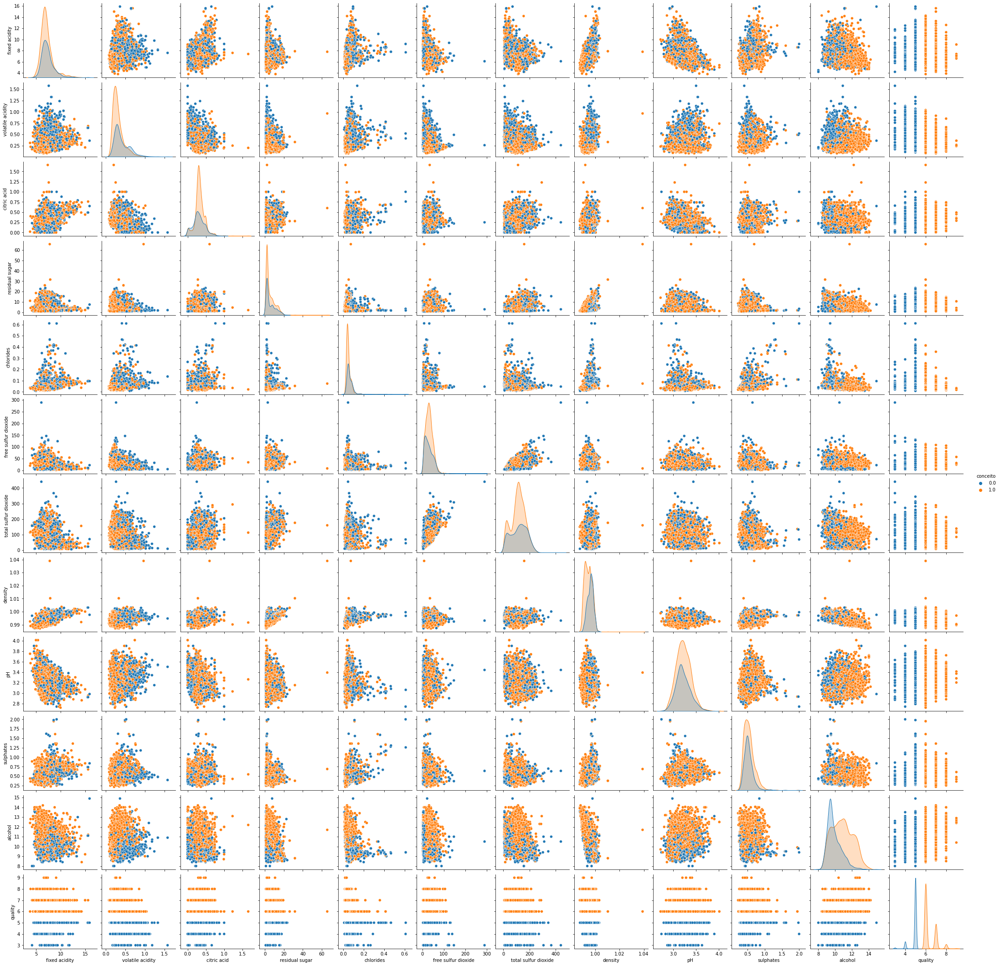

In [82]:
# Plot do pairplot
sns.pairplot(df, hue='conceito')

# Mostra o gráfico
plt.show()

**Regressão logística**

In [83]:
# avaliando a distribuição do target

df['conceito'].value_counts(normalize=True)

1.000   0.633
0.000   0.367
Name: conceito, dtype: float64

In [84]:
# criando as variáveis X e y, com as features e o target

X = df.select_dtypes(include=[np.number]).drop(columns='conceito')
y = df['conceito']

In [85]:
#Separando os dados em dados de treino e dados de teste

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.3, 
                                                    random_state=42)

In [86]:
#  Importando a classe do estimador que se deseja treinar

from sklearn.linear_model import LogisticRegression

# Instanciando a classe do estimador, escolhendo os hiperparâmetros desejados

model = LogisticRegression()

# ajustar o modelo -> treinar o modelo

model.fit(X_train, y_train)

LogisticRegression()

In [87]:
# testar o modelo -> predizer os valores de Xtest

y_pred = model.predict(X_test)

In [88]:
y_pred

array([1., 0., 1., ..., 1., 1., 1.])

In [89]:
y_test

1504   1.000
1419   0.000
3162   1.000
3091   1.000
2433   1.000
        ... 
2695   1.000
2158   1.000
4355   1.000
2819   1.000
4583   1.000
Name: conceito, Length: 1950, dtype: float64

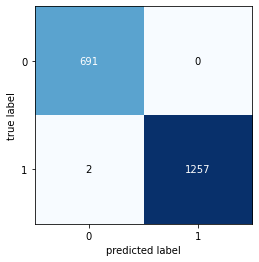

In [90]:
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(conf_mat=cm)
plt.show()

In [91]:
print('Acurácia: ', accuracy_score(y_test, y_pred))

Acurácia:  0.9989743589743589


In [92]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       691
         1.0       1.00      1.00      1.00      1259

    accuracy                           1.00      1950
   macro avg       1.00      1.00      1.00      1950
weighted avg       1.00      1.00      1.00      1950



Com uma acurácia de mais de 99% e outras métricas com valor 1, esta análise não se mostra consistente. Aguardamos considerações da professora.